<a href="https://colab.research.google.com/github/bala-codes/Yolo-v5_Object_Detection_Blood_Cell_Count_and_Detection/blob/master/codes/1.%20Yolo-V5%20BCC%20Training%20%26%20Testing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## reference
- https://towardsdatascience.com/yolo-v3-object-detection-53fb7d3bfe6b

## annotation tool
- https://github.com/tzutalin/labelImg
## helmet dataset
- https://www.kaggle.com/abhishek4273/helmet-dataset?
## custom detection(colab)
- https://colab.research.google.com/drive/13iqo2x-x9TbpzbR7-8Fb3Kif1QcZkMs-
## coco dataset
- https://towardsdatascience.com/master-the-coco-dataset-for-semantic-image-segmentation-part-1-of-2-732712631047

In [1]:
# !git clone 'https://github.com/Shenggan/BCCD_Dataset.git'

Cloning into 'BCCD_Dataset'...
remote: Enumerating objects: 800, done.
remote: Total 800 (delta 0), reused 0 (delta 0), pack-reused 800
Receiving objects: 100% (800/800), 7.39 MiB | 36.90 MiB/s, done.
Resolving deltas: 100% (378/378), done.


#**DATA PRE-PROCESSING STARTS**

# Extraction of data labels from .xml file to dataframe

In [18]:
import shutil
import os, sys, random
import xml.etree.ElementTree as ET
from glob import glob
import pandas as pd
from shutil import copyfile
import pandas as pd
from sklearn import preprocessing, model_selection
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import patches
import numpy as np
import os

In [19]:
# ! ls ../hook_helmet_dataset/annotations

In [20]:
annotations = sorted(glob('../hook_helmet_dataset/annotations/*.xml'))
# annotations

In [21]:
df = []
cnt = 0
for file in annotations:
  prev_filename = file.split('/')[-1].split('.')[0] + '.jpg'
  filename = str(cnt) + '.jpg'
  row = []
  parsedXML = ET.parse(file)
  for node in parsedXML.getroot().iter('object'):
    blood_cells = node.find('name').text
    xmin = int(node.find('bndbox/xmin').text)
    xmax = int(node.find('bndbox/xmax').text)
    ymin = int(node.find('bndbox/ymin').text)
    ymax = int(node.find('bndbox/ymax').text)

    row = [prev_filename, filename, blood_cells, xmin, xmax, ymin, ymax]
    df.append(row)
  cnt += 1

data = pd.DataFrame(df, columns=['prev_filename', 'filename', 'cell_type', 'xmin', 'xmax', 'ymin', 'ymax'])

data[['prev_filename','filename', 'cell_type', 'xmin', 'xmax', 'ymin', 'ymax']].to_csv('./hook_helmet_detection.csv', index=False)

# Processing data as per the YOLO_V5 format

**DATAFRAME STRUCTURE**

- filename : contains the name of the image
- cell_type: denotes the type of the cell
- xmin: x-coordinate of the bottom left part of the image
- xmax: x-coordinate of the top right part of the image
- ymin: y-coordinate of the bottom left part of the image
- ymax: y-coordinate of the top right part of the image
- labels : Encoded cell-type **(Yolo - label input-1)**
- width : width of that bbox
- height : height of that bbox
- x_center : bbox center (x-axis)
-	y_center : bbox center (y-axis)
-	x_center_norm	: x_center normalized (0-1) **(Yolo - label input-2)**
-	y_center_norm : y_center normalized (0-1) **(Yolo - label input-3)**
- width_norm : width normalized (0-1) **(Yolo - label input-4)**
-	height_norm : height normalized (0-1) **(Yolo - label input-5)**

In [22]:
# ! ls ../hook_helmet_dataset/images

In [23]:
# change file expentions from png,JPG to jpg
import os
import glob
from PIL import Image
img_list = glob.glob('../hook_helmet_dataset/images/*')
for i in img_list:
    if i[-3:]=='JPG':
        new_name = i.replace(".JPG",".jpg")
        os.rename(i,new_name)
    elif i[-3:]=='png':
        im1 = Image.open(i)
        new_name = i.replace(".png",".jpg")
        im1.save(new_name)
        os.remove(i)

In [24]:
from PIL import Image
# img_width = 640
# img_height = 480

def img_width(df):
    im = Image.open('../hook_helmet_dataset/images/'+df.prev_filename)
    return im.size[0]
def img_height(df):
    im = Image.open('../hook_helmet_dataset/images/'+df.prev_filename)
    return im.size[1]
def width(df):
  return int(df.xmax - df.xmin)
def height(df):
  return int(df.ymax - df.ymin)

def x_center(df):
  return int(df.xmin + (df.width/2))
def y_center(df):
  return int(df.ymin + (df.height/2))
# def w_norm(df):
#   return df/img_width
# def h_norm(df):
#   return df/img_height

In [25]:
# df = pd.read_csv('./hook_detection.csv')

In [26]:
df = pd.read_csv('./hook_helmet_detection.csv')

le = preprocessing.LabelEncoder()
le.fit(df['cell_type'])
print(le.classes_)
labels = le.transform(df['cell_type']) #categorize
df['labels'] = labels

df['img_width'] = df.apply(img_width, axis=1)
df['img_height'] = df.apply(img_height, axis=1)

df['width'] = df.apply(width, axis=1)
df['height'] = df.apply(height, axis=1)

df['x_center'] = df.apply(x_center, axis=1)
df['y_center'] = df.apply(y_center, axis=1)

## when size of images are different
df['x_center_norm'] = df[['x_center','img_width']].apply(lambda x: x[0]/x[1], axis=1) #/img_width
df['width_norm'] = df[['width','img_width']].apply(lambda x: x[0]/x[1], axis=1)

df['y_center_norm'] = df[['y_center','img_height']].apply(lambda x: x[0]/x[1], axis=1)
df['height_norm'] = df[['height','img_height']].apply(lambda x: x[0]/x[1], axis=1)
df.head(30)

['head' 'helmet' 'hook' 'person']


,prev_filename,filename,cell_type,xmin,xmax,ymin,ymax,labels,img_width,img_height,width,height,x_center,y_center,x_center_norm,width_norm,y_center_norm,height_norm
0,2018_0203_170450_129.jpg,0.jpg,hook,63,128,1,94,2,640,480,65,93,95,47,0.148438,0.101562,0.097917,0.193750
1,2018_0203_170505_134.jpg,1.jpg,hook,428,479,51,160,2,640,480,51,109,453,105,0.707812,0.079687,0.218750,0.227083
2,2018_0203_170505_134.jpg,1.jpg,helmet,238,344,2,61,1,640,480,106,59,291,31,0.454688,0.165625,0.064583,0.122917
3,2018_0203_170508_135.jpg,2.jpg,helmet,230,332,1,45,1,640,480,102,44,281,23,0.439063,0.159375,0.047917,0.091667
4,2018_0203_170511_136.jpg,3.jpg,helmet,247,353,1,47,1,640,480,106,46,300,24,0.468750,0.165625,0.050000,0.095833
5,2018_0203_170514_137.jpg,4.jpg,helmet,151,255,1,76,1,640,480,104,75,203,38,0.317188,0.162500,0.079167,0.156250
6,2018_0203_170526_141.jpg,5.jpg,hook,455,544,370,480,2,640,480,89,110,499,425,0.779687,0.139063,0.885417,0.229167
7,2018_0203_170532_143.jpg,6.jpg,helmet,99,236,1,77,1,640,480,137,76,167,39,0.260937,0.214062,0.081250,0.158333
8,2018_0203_170535_144.jpg,7.jpg,helmet,233,313,10,45,1,640,480,80,35,273,27,0.426563,0.125000,0.056250,0.072917
9,2018_0203_170538_145.jpg,8.jpg,hook,561,618,140,241,2,640,480,57,101,589,190,0.920312,0.089063,0.395833,0.210417


# Splitting into training and validation datasets

In [27]:
df_train, df_valid = model_selection.train_test_split(df, test_size=0.1, random_state=13, shuffle=True)
print(df_train.shape, df_valid.shape)

(23475, 18) (2609, 18)


In [28]:
! ls ../

codes		   hook_helmet_dataset	    Inference_files	README.md
data-preprocessed  hook_helmet_dataset.zip  old_helmet_dataset	VOC2028


In [29]:
# os.mkdir('../data-preprocessed')
# os.mkdir('../data-preprocessed/hook_helmet/')
# os.mkdir('../data-preprocessed/hook_helmet/images/')
# os.mkdir('../data-preprocessed/hook_helmet/images/train/')
# os.mkdir('../data-preprocessed/hook_helmet/images/valid/')

# os.mkdir('../data-preprocessed/hook_helmet/labels/')
# os.mkdir('../data-preprocessed/hook_helmet/labels/train/')
# os.mkdir('../data-preprocessed/hook_helmet/labels/valid/')

# Data segregation and moving to it's corresponding folders
- hook_helme
  - Images
    - Train (364 images [.jpg files])
    - Valid (270 images [.jpg files])
  - Labels
    - Train (364 labels [.txt files])
    - Valid (270 labels [.txt files])


In [30]:
def segregate_data(df, img_path, train_img_path, train_label_path):
  filenames = []
  for filename in df.filename:  
    filenames.append(filename)
  filenames = set(filenames)
  
  for filename in filenames:
    yolo_list = []

    for _,row in df[df.filename == filename].iterrows():
      yolo_list.append([row.labels, row.x_center_norm, row.y_center_norm, row.width_norm, row.height_norm])

    yolo_list = np.array(yolo_list)
#     print("yolo_list[:3]:",yolo_list[:3])
    txt_filename = os.path.join(train_label_path,str(row.prev_filename.split('.')[0])+".txt")
#     print(txt_filename)
    # Save the .img & .txt files to the corresponding train and validation folders
    np.savetxt(txt_filename, yolo_list, fmt=["%d", "%f", "%f", "%f", "%f"])
    shutil.copyfile(os.path.join(img_path,row.prev_filename), os.path.join(train_img_path,row.prev_filename))

In [31]:
%%time
# src_img_path = "../BCCD_Dataset/BCCD/JPEGImages/"
# src_label_path = "../BCCD_Dataset/BCCD/Annotations/"
src_img_path = "../hook_helmet_dataset/images"
# src_label_path = "../hook_axis/"

# train_img_path = "../images/train"
# train_label_path = "../data-preprocecced/bcc/labels/train"
train_img_path = "../data-preprocessed/hook_helmet/images/train/"
train_label_path = "../data-preprocessed/hook_helmet/labels/train/"

valid_img_path = "../data-preprocessed/hook_helmet/images/valid/"
valid_label_path = "../data-preprocessed/hook_helmet/labels/valid"

segregate_data(df_train, src_img_path,  train_img_path, train_label_path)
segregate_data(df_valid, src_img_path,  valid_img_path, valid_label_path)

CPU times: user 10.6 s, sys: 809 ms, total: 11.4 s
Wall time: 11.5 s


In [32]:
try:
  shutil.rmtree('../data-preprocessed/helmet/images/train/.ipynb_checkpoints')
except FileNotFoundError:
  pass

try:
  shutil.rmtree('../data-preprocessed/helmet/images/valid/.ipynb_checkpoints')
except FileNotFoundError:
  pass

try:
  shutil.rmtree('../data-preprocessed/helmet/labels/train/.ipynb_checkpoints')
except FileNotFoundError:
  pass

try:
  shutil.rmtree('../data-preprocessed/helmet/valid/.ipynb_checkpoints')
except FileNotFoundError:
  pass

print("No. of Training images", len(os.listdir('../data-preprocessed/helmet/images/train')))
print("No. of Training labels", len(os.listdir('../data-preprocessed/helmet/labels/train')))

print("No. of valid images", len(os.listdir('../data-preprocessed/helmet/images/valid')))
print("No. of valid labels", len(os.listdir('../data-preprocessed/helmet/labels/valid')))

No. of Training images 3112
No. of Training labels 3112
No. of valid images 1213
No. of valid labels 1213


# **END OF DATA PRE-PROCESSING**

#**YOLO V5 STARTS**

In [154]:
# !cp -r '/content/bcc' '/content/drive/My Drive/Machine Learning Projects/YOLO/'

# Cloning from the yolo v5 repo.
More can be found at here : [yolo](https://github.com/ultralytics/yolov5)

In [155]:
# !git clone  'https://github.com/ultralytics/yolov5.git'
## I downloaded as a zip file

In [156]:
# !pip install -qr '/content/yolov5/requirements.txt'  # install dependencies

# WE SHOULD CREATE A .yaml FILE AND THEN PLACE IT INSIDE THE yolov5 FOLDER

#**Contents of YAML file**

train: /content/bcc/images/train                    
val: /content/bcc/images/valid

nc: 3

names: ['Platelets', 'RBC', 'WBC']


#**Also edit the number of classes (nc) in the ./models/*.yaml file**

Choose the yolo model of your choice, here I chose yolov5s.yaml (yolo - small)


<img src="https://cdn-images-1.medium.com/max/600/1*hCE5VwKkqHlZW466umYTTA.png">

# Training command

**Training Parameters**

!python 
- <'location of train.py file'> 
- --img <'width of image'>
- --batch <'batch size'>
- --epochs <'no of epochs'>
- --data <'location of the .yaml file'>
- --cfg <'Which yolo configuration you want'>(yolov5s/yolov5m/yolov5l/yolov5x).yaml | (small, medium, large, xlarge)
- --name <'Name of the best model after training'>

In [33]:
df_train.head(3)

,prev_filename,filename,cell_type,xmin,xmax,ymin,ymax,labels,img_width,img_height,width,height,x_center,y_center,x_center_norm,width_norm,y_center_norm,height_norm
6859,hard_hat_workers2115.jpg,1572.jpg,helmet,101,118,76,95,1,416,415,17,19,109,85,0.262019,0.040865,0.204819,0.045783
19414,hard_hat_workers4349.jpg,4053.jpg,helmet,314,340,207,234,1,416,415,26,27,327,220,0.786058,0.062500,0.530120,0.065060
17640,hard_hat_workers402.jpg,3688.jpg,helmet,248,281,0,14,1,416,415,33,14,264,7,0.634615,0.079327,0.016867,0.033735


In [34]:
# df_train[df_train['prev_filename']=='00278.jpg']

In [35]:
%%time

!python train.py --img 640 --epochs 100 --data hook_helmet.yaml --cfg models/yolov5s.yaml --name HookHelmet

Using CUDA device0 _CudaDeviceProperties(name='GeForce RTX 2060', total_memory=5931MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=False, cfg='models/yolov5s.yaml', data='hook_helmet.yaml', device='', epochs=100, evolve=False, global_rank=-1, hyp='data/hyp.finetune.yaml', img_size=[640, 640], local_rank=-1, logdir='runs/', multi_scale=False, name='HookHelmet', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, sync_bn=False, total_batch_size=16, weights='yolov5s.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/", view at http://localhost:6006/
Hyperparameters {'lr0': 0.01, 'momentum': 0.94, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.4, 'cls_pw': 1.0, 'obj': 0.5, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 1.0, 'translate': 0.1, 'scale': 0.6, 'shear': 1.0, 'perspective': 0.0, 'flipud': 0.01, 'fliplr': 0.5, 'mixup': 0.2}
O

     10/99     3.24G    0.0376   0.02137  0.004429    0.0634        19       640
               Class      Images     Targets           P           R      mAP@.5
                 all    2.85e+03     3.8e+03       0.161       0.686       0.217       0.107

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     11/99     3.24G   0.03785   0.02148  0.004457   0.06378        15       640
               Class      Images     Targets           P           R      mAP@.5
                 all    2.85e+03     3.8e+03       0.133        0.71       0.234       0.121

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     12/99     3.24G    0.0371   0.02068  0.004299   0.06207        29       640
               Class      Images     Targets           P           R      mAP@.5
                 all    2.85e+03     3.8e+03       0.169         0.7       0.239       0.124

     Epoch   gpu_mem      GIoU       obj       cls     total   targets

               Class      Images     Targets           P           R      mAP@.5
                 all    2.85e+03     3.8e+03       0.208       0.754       0.249       0.146

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     35/99     3.24G   0.03403   0.01992  0.003229   0.05717        46       640
               Class      Images     Targets           P           R      mAP@.5
                 all    2.85e+03     3.8e+03       0.191       0.756        0.25       0.147

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     36/99     3.24G   0.03398   0.02011  0.003264   0.05735        47       640
               Class      Images     Targets           P           R      mAP@.5
                 all    2.85e+03     3.8e+03       0.201       0.789       0.257       0.148

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     37/99     3.24G   0.03378   0.01998  0.003243     0.057        43


     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     59/99     3.24G   0.03172   0.01915  0.002728   0.05359        20       640
               Class      Images     Targets           P           R      mAP@.5
                 all    2.85e+03     3.8e+03       0.216       0.837       0.266       0.163

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     60/99     3.24G   0.03178   0.01879    0.0027   0.05327        48       640
               Class      Images     Targets           P           R      mAP@.5
                 all    2.85e+03     3.8e+03       0.206       0.826       0.265       0.166

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     61/99     3.24G   0.03207   0.01916  0.002726   0.05396        19       640
               Class      Images     Targets           P           R      mAP@.5
                 all    2.85e+03     3.8e+03       0.206       0.832       0.256  

     83/99     3.24G   0.03026   0.01815  0.002361   0.05077        25       640
               Class      Images     Targets           P           R      mAP@.5
                 all    2.85e+03     3.8e+03       0.222       0.863       0.257       0.166

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     84/99     3.24G   0.03023    0.0185  0.002243   0.05097        45       640
               Class      Images     Targets           P           R      mAP@.5
                 all    2.85e+03     3.8e+03        0.22       0.881       0.262       0.168

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     85/99     3.24G   0.03005   0.01813   0.00216   0.05034        24       640
               Class      Images     Targets           P           R      mAP@.5
                 all    2.85e+03     3.8e+03       0.218       0.855       0.264       0.169

     Epoch   gpu_mem      GIoU       obj       cls     total   targets

In [36]:
# Start tensorboard (optional)
%load_ext tensorboard
%tensorboard --logdir runs/


ddd#**INFERENCE**

In [ ]:
#Optimizer stripped from runs/exp2_BCCM/weights/last_BCCM.pt, 14.8MB
#Optimizer stripped from runs/exp2_BCCM/weights/best_BCCM.pt, 14.8MB

# BATCH PREDICTION
- Results saved to inference/output


**Inference Parameters**

!python 
- <'location of detect.py file'> 
- --source <'location of image/ folder to predict'>
- --weight <'location of the saved best weights'>
- --output <'location of output files after prediction'>

In [33]:
!ls ../data-preprocessed/hook_helmet/images

train  valid


In [37]:
!python detect.py --source ../data-preprocessed/hook_helmet/images/valid/ --weights './runs/exp3_HookHelmet/weights/best_HookHelmet.pt' --output 'inference/output'

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=640, iou_thres=0.5, output='inference/output', save_txt=False, source='../data-preprocessed/hook_helmet/images/valid/', update=False, view_img=False, weights=['./runs/exp3_HookHelmet/weights/best_HookHelmet.pt'])
Using CUDA device0 _CudaDeviceProperties(name='GeForce RTX 2060', total_memory=5931MB)

Fusing layers... 
Model Summary: 140 layers, 7.25461e+06 parameters, 6.61683e+06 gradients
image 1/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/2018_0203_170544_147.jpg: 512x640 1 helmets, 1 hooks, Done. (0.013s)
image 2/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/2018_0203_171516_035.jpg: 512x640 2 hooks, Done. (0.008s)
image 3/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/2018_0203_171530_040.jpg: 512x640 1 helmets, 2 hooks, Done. (0.008s)
image 4/2849 /home/dayoung/dev/Yolo_Detection/data

image 52/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/2020_0813_110331_327.jpg: 512x640 1 helmets, 1 hooks, Done. (0.010s)
image 53/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/2020_0813_110334_328.jpg: 512x640 1 helmets, 1 hooks, Done. (0.009s)
image 54/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/2020_0813_110401_337.jpg: 512x640 1 helmets, Done. (0.010s)
image 55/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/2020_0813_110407_339.jpg: 512x640 Done. (0.008s)
image 56/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/2020_0813_110422_344.jpg: 512x640 1 helmets, 1 hooks, Done. (0.009s)
image 57/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/2020_0813_110425_345.jpg: 512x640 1 helmets, 1 hooks, Done. (0.009s)
image 58/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helme

image 107/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1038.jpg: 640x640 16 heads, Done. (0.008s)
image 108/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers104.jpg: 640x640 5 heads, Done. (0.008s)
image 109/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1040.jpg: 640x640 3 helmets, Done. (0.008s)
image 110/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1041.jpg: 640x640 2 helmets, Done. (0.008s)
image 111/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1043.jpg: 640x640 4 helmets, Done. (0.008s)
image 112/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1045.jpg: 640x640 1 heads, 8 helmets, Done. (0.008s)
image 113/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/vali

image 162/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1124.jpg: 640x640 2 helmets, Done. (0.008s)
image 163/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1125.jpg: 640x640 7 helmets, Done. (0.008s)
image 164/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1126.jpg: 640x640 2 helmets, Done. (0.008s)
image 165/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1127.jpg: 640x640 3 helmets, Done. (0.008s)
image 166/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1129.jpg: 640x640 5 heads, Done. (0.009s)
image 167/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1130.jpg: 640x640 3 heads, 1 helmets, Done. (0.009s)
image 168/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/va

image 217/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1216.jpg: 640x640 1 helmets, Done. (0.008s)
image 218/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1217.jpg: 640x640 19 heads, Done. (0.008s)
image 219/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers122.jpg: 640x640 3 heads, 8 helmets, Done. (0.008s)
image 220/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1220.jpg: 640x640 3 helmets, Done. (0.008s)
image 221/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1224.jpg: 640x640 3 helmets, Done. (0.008s)
image 222/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1226.jpg: 640x640 3 helmets, Done. (0.008s)
image 223/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/va

image 273/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers130.jpg: 640x640 6 helmets, 5 persons, Done. (0.008s)
image 274/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1300.jpg: 640x640 1 helmets, Done. (0.009s)
image 275/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1301.jpg: 640x640 2 helmets, Done. (0.008s)
image 276/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1303.jpg: 640x640 3 helmets, Done. (0.008s)
image 277/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1308.jpg: 640x640 4 helmets, Done. (0.008s)
image 278/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1309.jpg: 640x640 7 helmets, Done. (0.008s)
image 279/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images

image 327/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1400.jpg: 640x640 8 helmets, Done. (0.008s)
image 328/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1401.jpg: 640x640 6 helmets, Done. (0.009s)
image 329/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1404.jpg: 640x640 10 helmets, Done. (0.009s)
image 330/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1406.jpg: 640x640 3 helmets, Done. (0.008s)
image 331/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1407.jpg: 640x640 2 helmets, Done. (0.008s)
image 332/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1408.jpg: 640x640 1 helmets, Done. (0.008s)
image 333/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/ha

image 382/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1499.jpg: 640x640 8 helmets, Done. (0.008s)
image 383/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers150.jpg: 640x640 6 helmets, Done. (0.008s)
image 384/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1500.jpg: 640x640 9 helmets, Done. (0.008s)
image 385/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1501.jpg: 640x640 3 helmets, Done. (0.008s)
image 386/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1503.jpg: 640x640 1 heads, 3 helmets, Done. (0.008s)
image 387/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1506.jpg: 640x640 4 helmets, Done. (0.008s)
image 388/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/v

image 437/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1583.jpg: 640x640 2 helmets, 3 persons, Done. (0.008s)
image 438/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1585.jpg: 640x640 2 helmets, Done. (0.009s)
image 439/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1587.jpg: 640x640 1 helmets, Done. (0.009s)
image 440/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1589.jpg: 640x640 5 helmets, Done. (0.008s)
image 441/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers159.jpg: 640x640 6 helmets, Done. (0.008s)
image 442/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1591.jpg: 640x640 1 heads, 8 helmets, Done. (0.008s)
image 443/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helm

image 493/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1671.jpg: 640x640 4 helmets, Done. (0.008s)
image 494/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1674.jpg: 640x640 2 helmets, Done. (0.008s)
image 495/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1675.jpg: 640x640 1 helmets, Done. (0.009s)
image 496/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1676.jpg: 640x640 6 helmets, Done. (0.008s)
image 497/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1679.jpg: 640x640 2 heads, 4 helmets, Done. (0.009s)
image 498/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers168.jpg: 640x640 2 heads, 1 helmets, Done. (0.008s)
image 499/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet

image 548/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1749.jpg: 640x640 3 helmets, Done. (0.008s)
image 549/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers175.jpg: 640x640 2 helmets, Done. (0.008s)
image 550/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1750.jpg: 640x640 12 helmets, Done. (0.008s)
image 551/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1751.jpg: 640x640 15 heads, Done. (0.008s)
image 552/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1755.jpg: 640x640 14 heads, Done. (0.008s)
image 553/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1757.jpg: 640x640 3 helmets, Done. (0.008s)
image 554/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_

image 603/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1842.jpg: 640x640 4 heads, Done. (0.008s)
image 604/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1843.jpg: 640x640 1 heads, 19 helmets, Done. (0.009s)
image 605/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1844.jpg: 640x640 2 helmets, Done. (0.008s)
image 606/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1845.jpg: 640x640 2 helmets, Done. (0.008s)
image 607/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1847.jpg: 640x640 7 heads, Done. (0.009s)
image 608/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1848.jpg: 640x640 1 helmets, Done. (0.008s)
image 609/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/val

image 659/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers194.jpg: 640x640 7 helmets, Done. (0.008s)
image 660/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1940.jpg: 640x640 4 helmets, Done. (0.009s)
image 661/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1941.jpg: 640x640 4 helmets, Done. (0.008s)
image 662/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1942.jpg: 640x640 3 helmets, Done. (0.009s)
image 663/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1944.jpg: 640x640 5 helmets, Done. (0.009s)
image 664/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers1945.jpg: 640x640 2 heads, 4 helmets, Done. (0.009s)
image 665/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/v

image 715/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2024.jpg: 640x640 2 helmets, Done. (0.008s)
image 716/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2026.jpg: 640x640 7 helmets, Done. (0.008s)
image 717/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2030.jpg: 640x640 3 helmets, Done. (0.008s)
image 718/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2031.jpg: 640x640 8 helmets, Done. (0.008s)
image 719/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2032.jpg: 640x640 2 helmets, Done. (0.009s)
image 720/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2034.jpg: 640x640 11 heads, Done. (0.009s)
image 721/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard

image 771/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2105.jpg: 640x640 5 helmets, Done. (0.008s)
image 772/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2108.jpg: 640x640 7 heads, Done. (0.008s)
image 773/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2109.jpg: 640x640 6 helmets, Done. (0.008s)
image 774/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers211.jpg: 640x640 4 helmets, Done. (0.008s)
image 775/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2112.jpg: 640x640 3 helmets, Done. (0.008s)
image 776/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2113.jpg: 640x640 8 heads, Done. (0.008s)
image 777/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat

image 828/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2200.jpg: 640x640 9 helmets, Done. (0.008s)
image 829/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2201.jpg: 640x640 8 heads, Done. (0.009s)
image 830/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2202.jpg: 640x640 4 helmets, Done. (0.008s)
image 831/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2209.jpg: 640x640 1 heads, 18 helmets, 17 persons, Done. (0.008s)
image 832/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2211.jpg: 640x640 6 helmets, Done. (0.008s)
image 833/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2212.jpg: 640x640 2 heads, 7 helmets, Done. (0.008s)
image 834/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed

image 883/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2297.jpg: 640x640 9 helmets, Done. (0.008s)
image 884/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2298.jpg: 640x640 3 helmets, Done. (0.008s)
image 885/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2300.jpg: 640x640 12 heads, Done. (0.008s)
image 886/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2301.jpg: 640x640 4 helmets, Done. (0.008s)
image 887/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2303.jpg: 640x640 5 helmets, Done. (0.008s)
image 888/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2304.jpg: 640x640 2 helmets, Done. (0.008s)
image 889/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard

image 939/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2378.jpg: 640x640 1 heads, 9 helmets, Done. (0.008s)
image 940/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2379.jpg: 640x640 1 helmets, Done. (0.008s)
image 941/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2380.jpg: 640x640 2 helmets, Done. (0.008s)
image 942/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2383.jpg: 640x640 6 helmets, Done. (0.008s)
image 943/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2385.jpg: 640x640 11 heads, Done. (0.008s)
image 944/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2386.jpg: 640x640 2 helmets, Done. (0.008s)
image 945/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/v

image 993/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2463.jpg: 640x640 2 helmets, Done. (0.008s)
image 994/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2464.jpg: 640x640 10 helmets, Done. (0.008s)
image 995/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2465.jpg: 640x640 10 helmets, Done. (0.008s)
image 996/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2466.jpg: 640x640 4 helmets, Done. (0.008s)
image 997/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2467.jpg: 640x640 4 helmets, Done. (0.008s)
image 998/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2469.jpg: 640x640 11 heads, Done. (0.008s)
image 999/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/ha

image 1049/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2554.jpg: 640x640 8 helmets, Done. (0.008s)
image 1050/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2556.jpg: 640x640 5 helmets, Done. (0.008s)
image 1051/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2557.jpg: 640x640 2 helmets, Done. (0.008s)
image 1052/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2559.jpg: 640x640 8 helmets, Done. (0.008s)
image 1053/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers256.jpg: 640x640 9 helmets, Done. (0.008s)
image 1054/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2560.jpg: 640x640 2 helmets, Done. (0.008s)
image 1055/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/val

image 1105/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2635.jpg: 640x640 9 helmets, 1 persons, Done. (0.008s)
image 1106/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2638.jpg: 640x640 2 heads, 2 helmets, Done. (0.008s)
image 1107/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2640.jpg: 640x640 17 helmets, Done. (0.008s)
image 1108/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2641.jpg: 640x640 2 helmets, Done. (0.008s)
image 1109/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2642.jpg: 640x640 7 helmets, Done. (0.008s)
image 1110/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2643.jpg: 640x640 6 helmets, Done. (0.008s)
image 1111/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/

image 1160/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers272.jpg: 640x640 1 helmets, Done. (0.009s)
image 1161/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2720.jpg: 640x640 14 helmets, Done. (0.008s)
image 1162/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2723.jpg: 640x640 2 helmets, Done. (0.008s)
image 1163/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2724.jpg: 640x640 6 heads, Done. (0.009s)
image 1164/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2725.jpg: 640x640 6 helmets, Done. (0.008s)
image 1165/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2726.jpg: 640x640 3 helmets, Done. (0.008s)
image 1166/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/vali

image 1215/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2808.jpg: 640x640 2 helmets, Done. (0.008s)
image 1216/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2809.jpg: 640x640 4 heads, 2 helmets, Done. (0.008s)
image 1217/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers281.jpg: 640x640 2 heads, 8 helmets, Done. (0.008s)
image 1218/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2812.jpg: 640x640 1 heads, 10 helmets, Done. (0.008s)
image 1219/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2815.jpg: 640x640 7 helmets, Done. (0.008s)
image 1220/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2816.jpg: 640x640 18 heads, Done. (0.009s)
image 1221/2849 /home/dayoung/dev/Yolo_Detection/data-preproce

image 1270/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2911.jpg: 640x640 6 helmets, Done. (0.009s)
image 1271/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2912.jpg: 640x640 10 heads, Done. (0.008s)
image 1272/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2913.jpg: 640x640 5 helmets, Done. (0.008s)
image 1273/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2914.jpg: 640x640 4 heads, 12 helmets, Done. (0.008s)
image 1274/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers2916.jpg: 640x640 3 helmets, Done. (0.008s)
image 1275/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers292.jpg: 640x640 4 helmets, Done. (0.008s)
image 1276/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/i

image 1327/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers302.jpg: 640x640 8 heads, Done. (0.008s)
image 1328/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3020.jpg: 640x640 1 helmets, Done. (0.008s)
image 1329/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3021.jpg: 640x640 10 helmets, Done. (0.008s)
image 1330/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3023.jpg: 640x640 12 heads, 2 helmets, Done. (0.008s)
image 1331/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3026.jpg: 640x640 11 heads, 2 helmets, Done. (0.008s)
image 1332/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3031.jpg: 640x640 3 helmets, Done. (0.008s)
image 1333/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hoo

image 1382/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3104.jpg: 640x640 6 helmets, Done. (0.008s)
image 1383/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3106.jpg: 640x640 3 helmets, Done. (0.008s)
image 1384/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3107.jpg: 640x640 9 helmets, Done. (0.008s)
image 1385/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3109.jpg: 640x640 11 helmets, Done. (0.008s)
image 1386/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers311.jpg: 640x640 4 heads, 3 helmets, Done. (0.008s)
image 1387/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3110.jpg: 640x640 Done. (0.007s)
image 1388/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/vali

image 1436/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3193.jpg: 640x640 1 helmets, Done. (0.008s)
image 1437/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3194.jpg: 640x640 4 helmets, Done. (0.008s)
image 1438/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3196.jpg: 640x640 3 heads, 1 helmets, Done. (0.008s)
image 1439/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3198.jpg: 640x640 11 heads, Done. (0.008s)
image 1440/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3199.jpg: 640x640 2 helmets, Done. (0.008s)
image 1441/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers32.jpg: 640x640 9 heads, Done. (0.008s)
image 1442/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/image

image 1492/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3282.jpg: 640x640 16 heads, Done. (0.009s)
image 1493/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3283.jpg: 640x640 15 helmets, Done. (0.008s)
image 1494/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3284.jpg: 640x640 9 heads, Done. (0.008s)
image 1495/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3285.jpg: 640x640 4 heads, 4 helmets, Done. (0.008s)
image 1496/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3286.jpg: 640x640 2 helmets, 2 persons, Done. (0.008s)
image 1497/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3287.jpg: 640x640 2 helmets, Done. (0.008s)
image 1498/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hoo

image 1547/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3377.jpg: 640x640 21 heads, Done. (0.009s)
image 1548/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3378.jpg: 640x640 1 heads, 3 helmets, Done. (0.009s)
image 1549/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers338.jpg: 640x640 10 helmets, Done. (0.008s)
image 1550/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3380.jpg: 640x640 7 heads, Done. (0.008s)
image 1551/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3381.jpg: 640x640 2 helmets, Done. (0.008s)
image 1552/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3382.jpg: 640x640 1 helmets, Done. (0.008s)
image 1553/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/ima

image 1604/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3467.jpg: 640x640 2 heads, 12 helmets, Done. (0.008s)
image 1605/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3468.jpg: 640x640 4 helmets, Done. (0.008s)
image 1606/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3471.jpg: 640x640 2 helmets, 1 persons, Done. (0.008s)
image 1607/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3474.jpg: 640x640 1 helmets, Done. (0.008s)
image 1608/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3475.jpg: 640x640 14 helmets, Done. (0.008s)
image 1609/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3477.jpg: 640x640 3 helmets, Done. (0.008s)
image 1610/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed

image 1660/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3554.jpg: 640x640 15 helmets, Done. (0.008s)
image 1661/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3555.jpg: 640x640 2 heads, 2 helmets, Done. (0.008s)
image 1662/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3556.jpg: 640x640 1 heads, 5 helmets, Done. (0.008s)
image 1663/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3558.jpg: 640x640 2 helmets, Done. (0.008s)
image 1664/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3559.jpg: 640x640 3 helmets, Done. (0.008s)
image 1665/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3560.jpg: 640x640 3 helmets, Done. (0.008s)
image 1666/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/ho

image 1716/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3643.jpg: 640x640 14 heads, Done. (0.008s)
image 1717/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3644.jpg: 640x640 11 heads, Done. (0.008s)
image 1718/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers365.jpg: 640x640 4 helmets, Done. (0.008s)
image 1719/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3650.jpg: 640x640 4 heads, Done. (0.008s)
image 1720/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3651.jpg: 640x640 4 helmets, Done. (0.008s)
image 1721/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3654.jpg: 640x640 1 helmets, Done. (0.008s)
image 1722/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/h

image 1770/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3737.jpg: 640x640 6 helmets, Done. (0.008s)
image 1771/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3739.jpg: 640x640 17 heads, 10 helmets, Done. (0.008s)
image 1772/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3740.jpg: 640x640 3 helmets, Done. (0.008s)
image 1773/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3742.jpg: 640x640 2 helmets, Done. (0.008s)
image 1774/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3745.jpg: 640x640 2 helmets, Done. (0.008s)
image 1775/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3747.jpg: 640x640 8 helmets, Done. (0.008s)
image 1776/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helme

image 1826/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3833.jpg: 640x640 2 helmets, Done. (0.008s)
image 1827/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3834.jpg: 640x640 2 helmets, Done. (0.008s)
image 1828/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3835.jpg: 640x640 2 helmets, Done. (0.008s)
image 1829/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3837.jpg: 640x640 5 heads, Done. (0.008s)
image 1830/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3839.jpg: 640x640 5 heads, 1 helmets, Done. (0.008s)
image 1831/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3840.jpg: 640x640 7 heads, 2 helmets, Done. (0.008s)
image 1832/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_

image 1883/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3924.jpg: 640x640 4 helmets, Done. (0.008s)
image 1884/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3925.jpg: 640x640 4 heads, Done. (0.008s)
image 1885/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3928.jpg: 640x640 6 helmets, Done. (0.008s)
image 1886/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers393.jpg: 640x640 3 helmets, Done. (0.008s)
image 1887/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3935.jpg: 640x640 2 helmets, Done. (0.008s)
image 1888/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers3936.jpg: 640x640 5 helmets, Done. (0.008s)
image 1889/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid

image 1940/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4018.jpg: 640x640 3 helmets, Done. (0.008s)
image 1941/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4019.jpg: 640x640 3 helmets, Done. (0.008s)
image 1942/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers402.jpg: 640x640 6 helmets, Done. (0.008s)
image 1943/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4020.jpg: 640x640 7 helmets, Done. (0.008s)
image 1944/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4022.jpg: 640x640 2 helmets, Done. (0.008s)
image 1945/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4024.jpg: 640x640 10 helmets, Done. (0.008s)
image 1946/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/va

image 1994/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4112.jpg: 640x640 3 helmets, Done. (0.008s)
image 1995/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4114.jpg: 640x640 3 helmets, Done. (0.008s)
image 1996/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4117.jpg: 640x640 4 helmets, Done. (0.008s)
image 1997/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4118.jpg: 640x640 5 helmets, Done. (0.008s)
image 1998/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4119.jpg: 640x640 3 helmets, 2 persons, Done. (0.008s)
image 1999/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers412.jpg: 640x640 6 helmets, Done. (0.008s)
image 2000/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet

image 2047/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4193.jpg: 640x640 2 helmets, Done. (0.008s)
image 2048/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4196.jpg: 640x640 2 heads, 3 helmets, Done. (0.008s)
image 2049/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4197.jpg: 640x640 1 helmets, Done. (0.008s)
image 2050/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4198.jpg: 640x640 4 helmets, Done. (0.008s)
image 2051/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4199.jpg: 640x640 4 helmets, Done. (0.008s)
image 2052/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers42.jpg: 640x640 2 heads, 5 helmets, Done. (0.008s)
image 2053/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_

image 2103/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4272.jpg: 640x640 4 helmets, Done. (0.008s)
image 2104/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4273.jpg: 640x640 6 helmets, Done. (0.008s)
image 2105/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4277.jpg: 640x640 5 helmets, Done. (0.008s)
image 2106/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4279.jpg: 640x640 11 helmets, Done. (0.008s)
image 2107/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4283.jpg: 640x640 8 helmets, Done. (0.008s)
image 2108/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4285.jpg: 640x640 10 helmets, Done. (0.008s)
image 2109/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/

image 2159/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4365.jpg: 640x640 5 helmets, 9 persons, Done. (0.008s)
image 2160/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4366.jpg: 640x640 7 helmets, Done. (0.008s)
image 2161/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4368.jpg: 640x640 4 heads, 1 helmets, Done. (0.008s)
image 2162/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers437.jpg: 640x640 2 helmets, Done. (0.008s)
image 2163/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4373.jpg: 640x640 6 helmets, Done. (0.008s)
image 2164/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4375.jpg: 640x640 4 helmets, Done. (0.008s)
image 2165/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/ho

image 2214/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4460.jpg: 640x640 4 helmets, Done. (0.009s)
image 2215/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4462.jpg: 640x640 3 helmets, Done. (0.009s)
image 2216/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4464.jpg: 640x640 5 helmets, Done. (0.008s)
image 2217/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4467.jpg: 640x640 3 helmets, Done. (0.008s)
image 2218/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4468.jpg: 640x640 4 heads, 3 helmets, Done. (0.008s)
image 2219/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4469.jpg: 640x640 3 helmets, Done. (0.008s)
image 2220/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/

image 2270/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4552.jpg: 640x640 2 helmets, 1 persons, Done. (0.008s)
image 2271/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4553.jpg: 640x640 2 helmets, Done. (0.008s)
image 2272/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4554.jpg: 640x640 2 helmets, Done. (0.008s)
image 2273/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4555.jpg: 640x640 1 heads, 5 helmets, Done. (0.008s)
image 2274/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers456.jpg: 640x640 1 heads, 6 helmets, Done. (0.008s)
image 2275/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4560.jpg: 640x640 6 heads, 7 helmets, Done. (0.008s)
image 2276/2849 /home/dayoung/dev/Yolo_Detection/da

image 2325/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4631.jpg: 640x640 3 helmets, 5 persons, Done. (0.009s)
image 2326/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4632.jpg: 640x640 16 helmets, Done. (0.008s)
image 2327/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4636.jpg: 640x640 2 helmets, Done. (0.008s)
image 2328/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4638.jpg: 640x640 2 helmets, Done. (0.008s)
image 2329/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4641.jpg: 640x640 3 heads, 10 helmets, Done. (0.008s)
image 2330/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4643.jpg: 640x640 4 helmets, Done. (0.008s)
image 2331/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed

image 2381/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4717.jpg: 640x640 7 helmets, Done. (0.008s)
image 2382/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4718.jpg: 640x640 1 helmets, Done. (0.008s)
image 2383/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4721.jpg: 640x640 11 helmets, Done. (0.008s)
image 2384/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4722.jpg: 640x640 4 helmets, Done. (0.008s)
image 2385/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4729.jpg: 640x640 3 helmets, Done. (0.008s)
image 2386/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers473.jpg: 640x640 4 helmets, Done. (0.008s)
image 2387/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/va

image 2437/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4798.jpg: 640x640 12 heads, 4 helmets, Done. (0.008s)
image 2438/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers48.jpg: 640x640 9 helmets, Done. (0.008s)
image 2439/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4800.jpg: 640x640 3 helmets, Done. (0.008s)
image 2440/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4801.jpg: 640x640 6 heads, Done. (0.008s)
image 2441/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4803.jpg: 640x640 8 helmets, 1 persons, Done. (0.008s)
image 2442/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4804.jpg: 640x640 13 helmets, Done. (0.008s)
image 2443/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hoo

image 2493/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers489.jpg: 640x640 7 heads, 1 helmets, Done. (0.008s)
image 2494/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4890.jpg: 640x640 8 helmets, Done. (0.008s)
image 2495/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4892.jpg: 640x640 5 helmets, Done. (0.008s)
image 2496/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4893.jpg: 640x640 4 helmets, Done. (0.008s)
image 2497/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4894.jpg: 640x640 4 helmets, Done. (0.008s)
image 2498/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4895.jpg: 640x640 15 helmets, Done. (0.008s)
image 2499/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/

image 2549/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4987.jpg: 640x640 5 helmets, Done. (0.008s)
image 2550/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4988.jpg: 640x640 10 helmets, Done. (0.008s)
image 2551/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4990.jpg: 640x640 1 helmets, Done. (0.008s)
image 2552/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4992.jpg: 640x640 2 helmets, Done. (0.008s)
image 2553/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4994.jpg: 640x640 4 helmets, Done. (0.008s)
image 2554/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers4997.jpg: 640x640 6 helmets, Done. (0.008s)
image 2555/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/v

image 2603/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers592.jpg: 640x640 5 helmets, Done. (0.008s)
image 2604/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers593.jpg: 640x640 8 heads, 7 helmets, Done. (0.009s)
image 2605/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers594.jpg: 640x640 3 helmets, Done. (0.008s)
image 2606/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers595.jpg: 640x640 9 helmets, Done. (0.008s)
image 2607/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers596.jpg: 640x640 9 helmets, Done. (0.008s)
image 2608/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers597.jpg: 640x640 6 helmets, Done. (0.008s)
image 2609/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images

image 2659/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers686.jpg: 640x640 6 helmets, Done. (0.008s)
image 2660/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers688.jpg: 640x640 2 helmets, Done. (0.008s)
image 2661/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers689.jpg: 640x640 4 helmets, Done. (0.008s)
image 2662/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers69.jpg: 640x640 14 heads, Done. (0.008s)
image 2663/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers690.jpg: 640x640 15 heads, Done. (0.008s)
image 2664/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers692.jpg: 640x640 9 helmets, Done. (0.008s)
image 2665/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_

image 2713/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers774.jpg: 640x640 5 helmets, Done. (0.008s)
image 2714/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers775.jpg: 640x640 13 helmets, Done. (0.008s)
image 2715/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers776.jpg: 640x640 2 helmets, Done. (0.008s)
image 2716/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers777.jpg: 640x640 2 helmets, Done. (0.008s)
image 2717/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers78.jpg: 640x640 11 helmets, Done. (0.009s)
image 2718/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers785.jpg: 640x640 6 helmets, Done. (0.008s)
image 2719/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/h

image 2768/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers864.jpg: 640x640 4 helmets, Done. (0.008s)
image 2769/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers865.jpg: 640x640 2 helmets, Done. (0.008s)
image 2770/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers868.jpg: 640x640 10 helmets, Done. (0.008s)
image 2771/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers872.jpg: 640x640 2 helmets, Done. (0.008s)
image 2772/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers873.jpg: 640x640 2 helmets, 3 persons, Done. (0.008s)
image 2773/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers876.jpg: 640x640 3 helmets, Done. (0.009s)
image 2774/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/ima

image 2822/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers951.jpg: 640x640 6 helmets, Done. (0.008s)
image 2823/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers952.jpg: 640x640 1 helmets, Done. (0.008s)
image 2824/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers953.jpg: 640x640 8 heads, Done. (0.008s)
image 2825/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers955.jpg: 640x640 7 heads, 1 helmets, Done. (0.008s)
image 2826/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers956.jpg: 640x640 6 helmets, Done. (0.008s)
image 2827/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/valid/hard_hat_workers957.jpg: 640x640 10 heads, Done. (0.008s)
image 2828/2849 /home/dayoung/dev/Yolo_Detection/data-preprocessed/hook_helmet/images/va

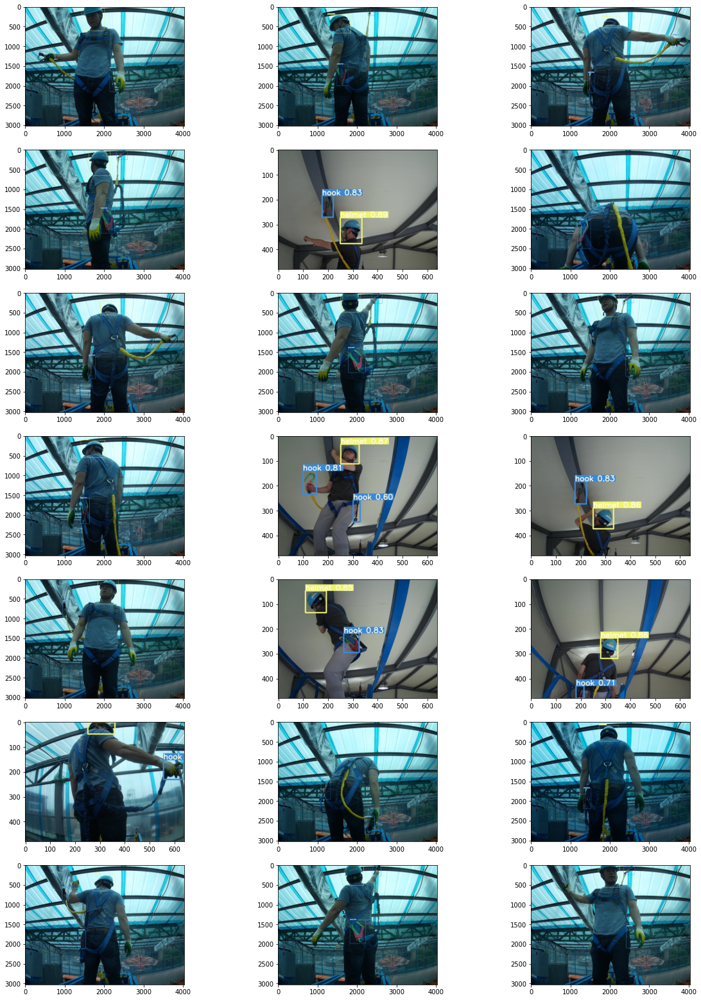

In [48]:
# hook+helmet+head+person detection model
disp_images = glob.glob('inference/output/2018*')
fig=plt.figure(figsize=(20, 28))
columns = 3
rows = 7
for i in range(1, columns*rows +1):
#     img = np.random.choice(disp_images)
    img = disp_images[i+4]
    img = plt.imread(img)
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
plt.show()

# SINGLE IMAGE PREDICTIONS


In [118]:
output = !python detect.py --source ../imgs/images/valid/2018_0211_180937_121.JPG \
--weights './runs/exp4_HOOK/weights/best_HOOK.pt' --output 'inference/single_output'
print(output)

["Using CUDA device0 _CudaDeviceProperties(name='GeForce RTX 2060', total_memory=5931MB)", '', 'Model Summary: 140 layers, 7.24652e+06 parameters, 6.61683e+06 gradients', "Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=640, iou_thres=0.5, output='inference/single_output', save_txt=False, source='../imgs/images/valid/2018_0211_180937_121.JPG', update=False, view_img=False, weights=['./runs/exp4_HOOK/weights/best_HOOK.pt'])", 'Fusing layers... ', 'image 1/1 /home/dayoung/dev/Yolo_Object_Detection/imgs/images/valid/2018_0211_180937_121.JPG: 512x640 Done. (0.008s)', 'Results saved to inference/single_output', 'Done. (0.025s)']


['inference/single_output/2018_0211_180937_121.JPG']


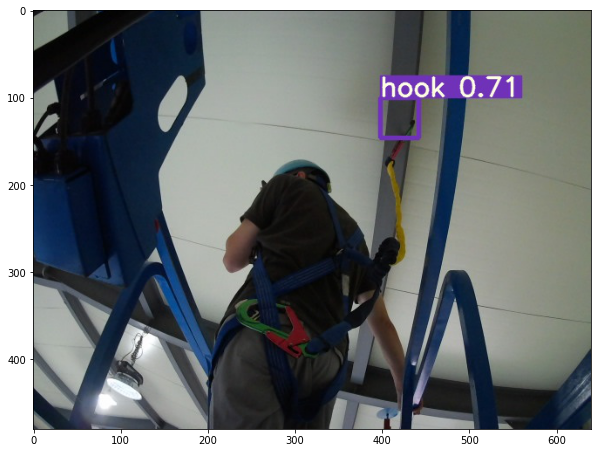

In [119]:
disp_images = glob('inference/single_output/*')
print(disp_images)
fig=plt.figure(figsize=(10, 18))
plt.imread(disp_images[0])
plt.imshow(img)